# YOLO5 Tutorial

YOLO is short for You Only Look Once. 

It is a family of single-stage deep learning based object detectors. 

They are capable of more than real-time object detection with state-of-the-art accuracy.

In [1]:
# import the libraries
import os

import glob as glob

import matplotlib.pyplot as plt

import cv2

import requests


In [2]:
# Define the hyperparameter values
TRAIN = True

# Number of epochs to train for.

EPOCHS = 5


In [3]:
# Helper Function to Download Files


def download_file(url, save_name):

    url = url

    if not os.path.exists(save_name):

        file = requests.get(url)

        open(save_name, 'wb').write(file.content)

    else:

        print('File already present, skipping download...')


About the dataset
The dataset contains images of various vehicles in varied traffic conditions. These images have been collected
from the Open Image dataset.  
It contains 5 classes in total. They are Car, Bus, Motorcycle, Truck, Ambulance. 

In [4]:
# Pulling the data from Roboflow

if not os.path.exists('train'):

    # VOC: added "/usr/bin"
    !/usr/bin/curl -L "https://public.roboflow.com/ds/xKLV14HbTF?key=aJzo7msVta" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

     

    dirs = ['train', 'valid', 'test']

 

    for i, dir_name in enumerate(dirs):
        all_image_names = sorted(os.listdir(f"{dir_name}/images/"))
        for j, image_name in enumerate(all_image_names):
            if (j % 2) == 0:

                file_name = image_name.split('.jpg')[0]
                os.remove(f"{dir_name}/images/{image_name}")

                os.remove(f"{dir_name}/labels/{file_name}.txt")


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   888  100   888    0     0   3376      0 --:--:-- --:--:-- --:--:--  3376
100 38.4M  100 38.4M    0     0  32.5M      0  0:00:01  0:00:01 --:--:-- 32.5M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg  
 extracting: test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg  
 extractin

In [5]:
# clone the yolo5 repository
if not os.path.exists('yolov5'):

    !git clone https://github.com/ultralytics/yolov5.git

%cd yolov5/

# VOC: pip3
!pip3 install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 12192, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 12192 (delta 8), reused 9 (delta 4), pack-reused 12173
Receiving objects: 100% (12192/12192), 11.92 MiB | 30.83 MiB/s, done.
Resolving deltas: 100% (8437/8437), done.
Checking out files: 100% (110/110), done.
/home/labsuser/yolov5
Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.


In [6]:
# directory to store results

def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

In [7]:
# Running the model

RES_DIR = set_res_dir()
if TRAIN:
    # VOC: python3
    !python3 train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}



Current number of result directories: 0
results_1
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-246-g2dd3db0 Python-3.7.13 torch-1.10.2+cu102 CUDA:0 (NVIDIA Tesla V100-SXM2-16GB, 16160MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0

In [8]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [9]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    # VOC: python3
    !python3 detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

In [10]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png			       results.png
events.out.tfevents.1654599171.jupyter.1587.0  train_batch0.jpg
F1_curve.png				       train_batch1.jpg
hyp.yaml				       train_batch2.jpg
labels_correlogram.jpg			       val_batch0_labels.jpg
labels.jpg				       val_batch0_pred.jpg
opt.yaml				       val_batch1_labels.jpg
P_curve.png				       val_batch1_pred.jpg
PR_curve.png				       val_batch2_labels.jpg
R_curve.png				       val_batch2_pred.jpg
results.csv				       weights
['runs/train/results_1/val_batch1_pred.jpg', 'runs/train/results_1/val_batch0_pred.jpg', 'runs/train/results_1/val_batch2_pred.jpg']


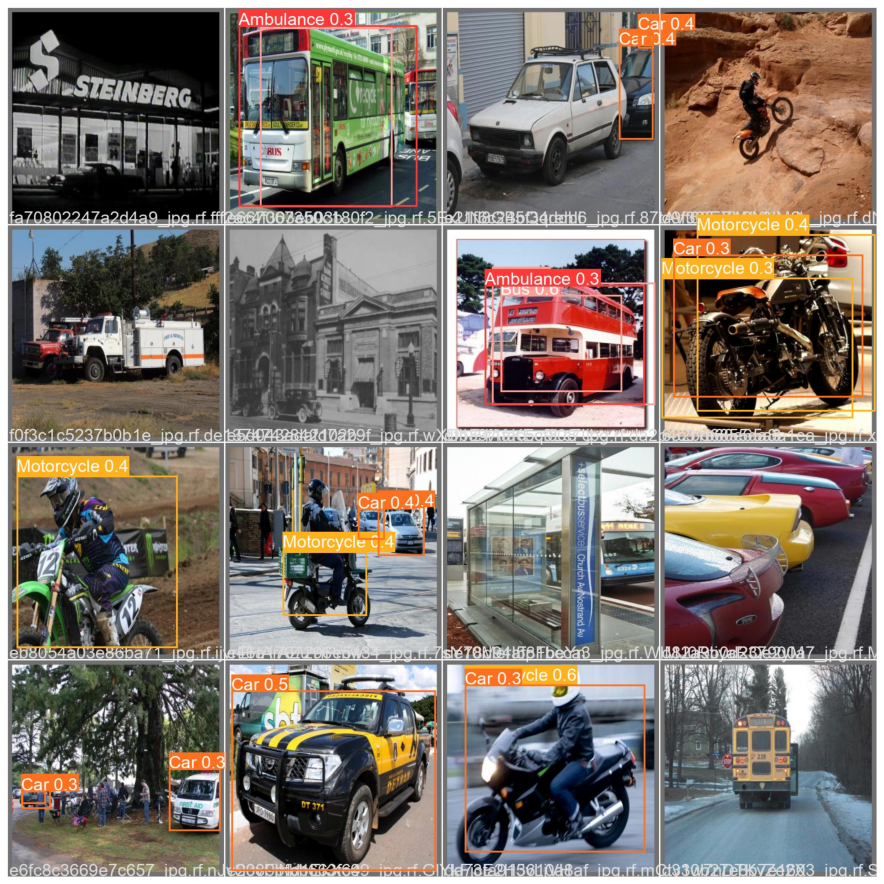

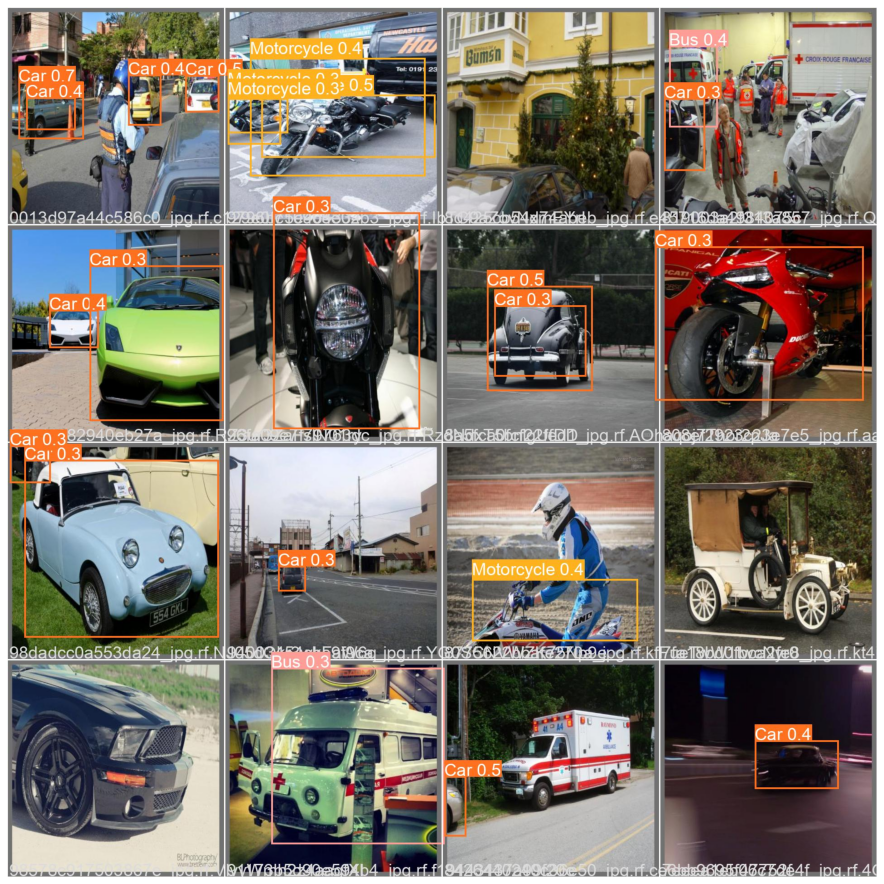

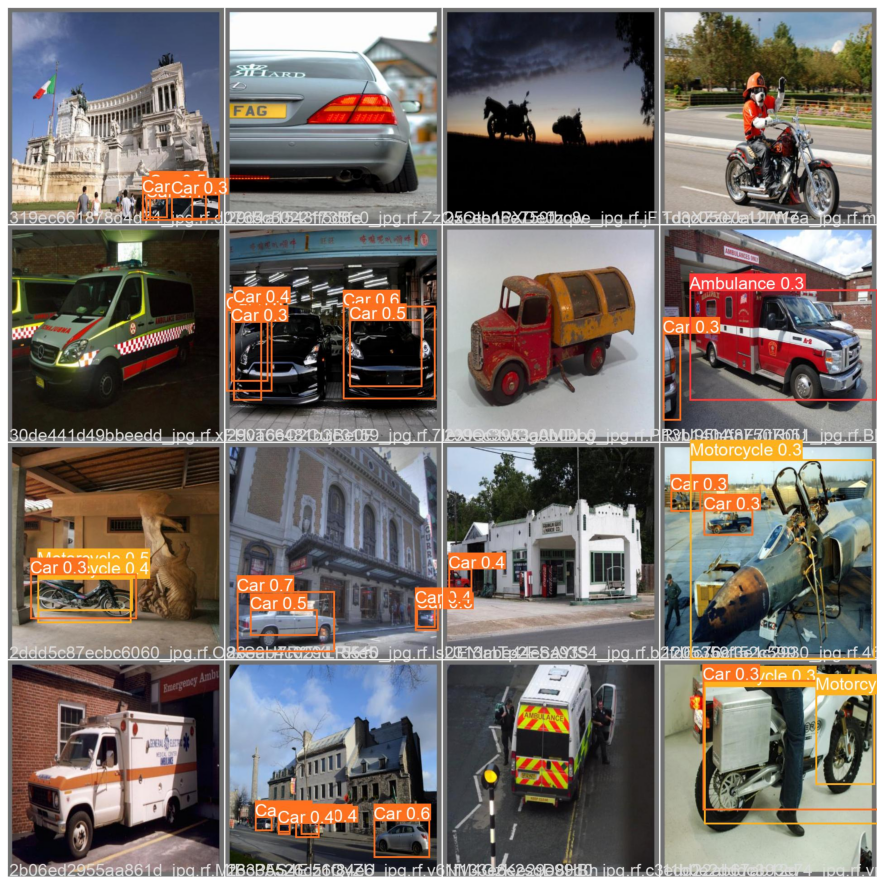

In [11]:
show_valid_results(RES_DIR)

In [12]:
# Downloading new files for inference

download_file('https://learnopencv.s3.us-west-2.amazonaws.com/yolov5_inference_data.zip',
              'inference_data.zip')
if not os.path.exists('inference_images'):
    !unzip -q "inference_data.zip"
else:
    print('Dataset already present')

In [13]:
# Inference on images.
IMAGE_INFER_DIR = inference(RES_DIR, 'inference_images')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_1/weights/best.pt'], source=inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-246-g2dd3db0 Python-3.7.13 torch-1.10.2+cu102 CUDA:0 (NVIDIA Tesla V100-SXM2-16GB, 16160MiB)

Fusing layers... 
Model summary: 213 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/4 /home/labsuser/yolov5/inference_images/image_1.jpg: 448x640 3 Cars, Done. (0.009s)
image 2/4 /home/labsuser/yolov5/inference_images/image_2.jpg: 416x640 2 Cars, Done. (0.009s)
image 3/4 /home/labsuser/yolov5/inference_images/image_3.jpg: 448x640 1 Bus, 1 

['runs/detect/inference_1/image_3.jpg', 'runs/detect/inference_1/image_1.jpg', 'runs/detect/inference_1/image_4.jpg', 'runs/detect/inference_1/image_2.jpg']


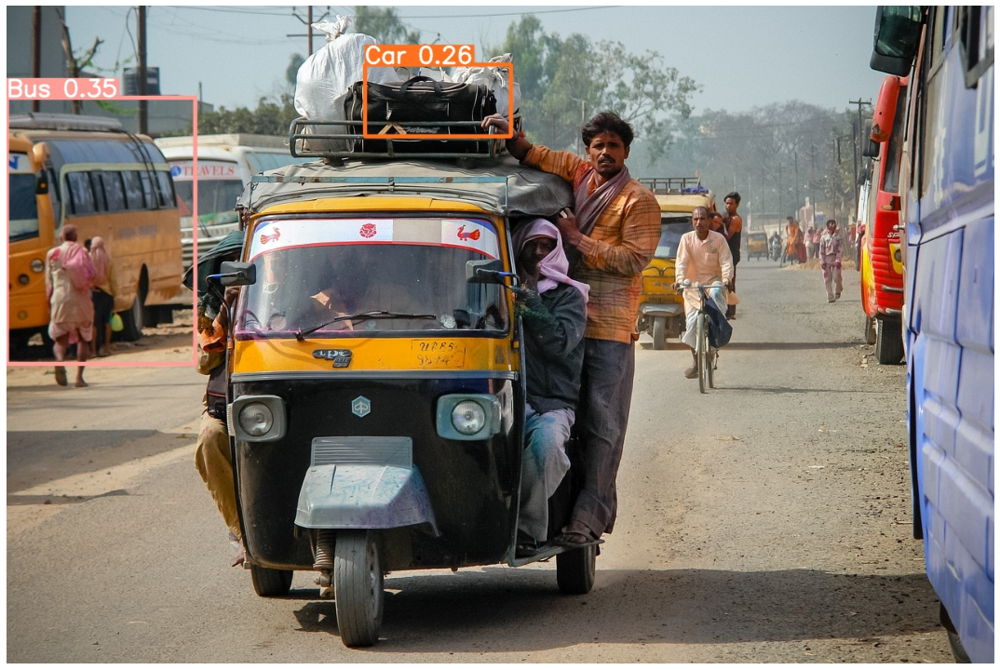

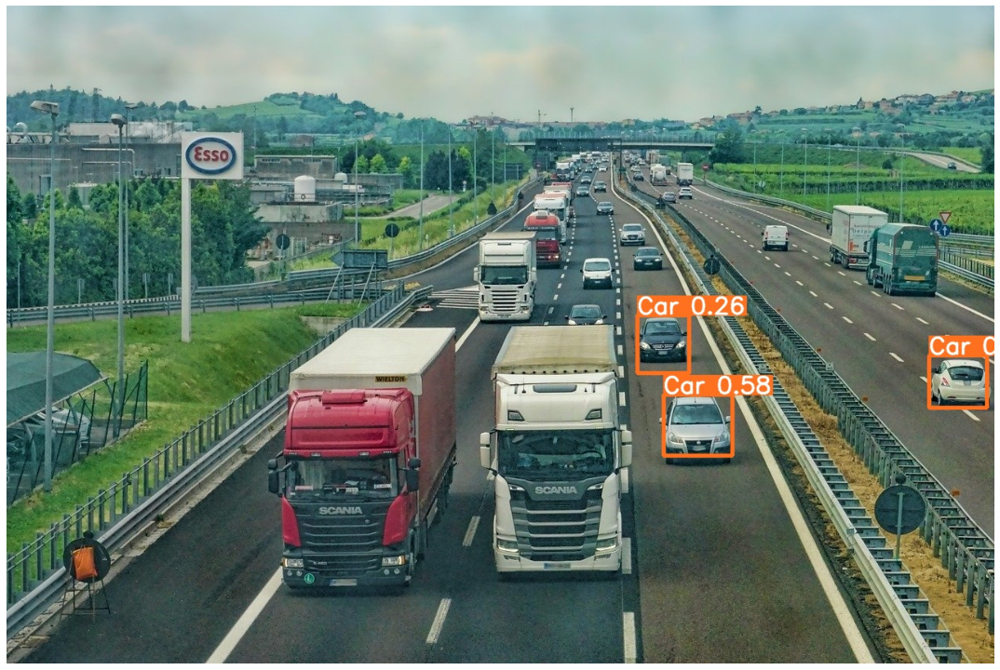

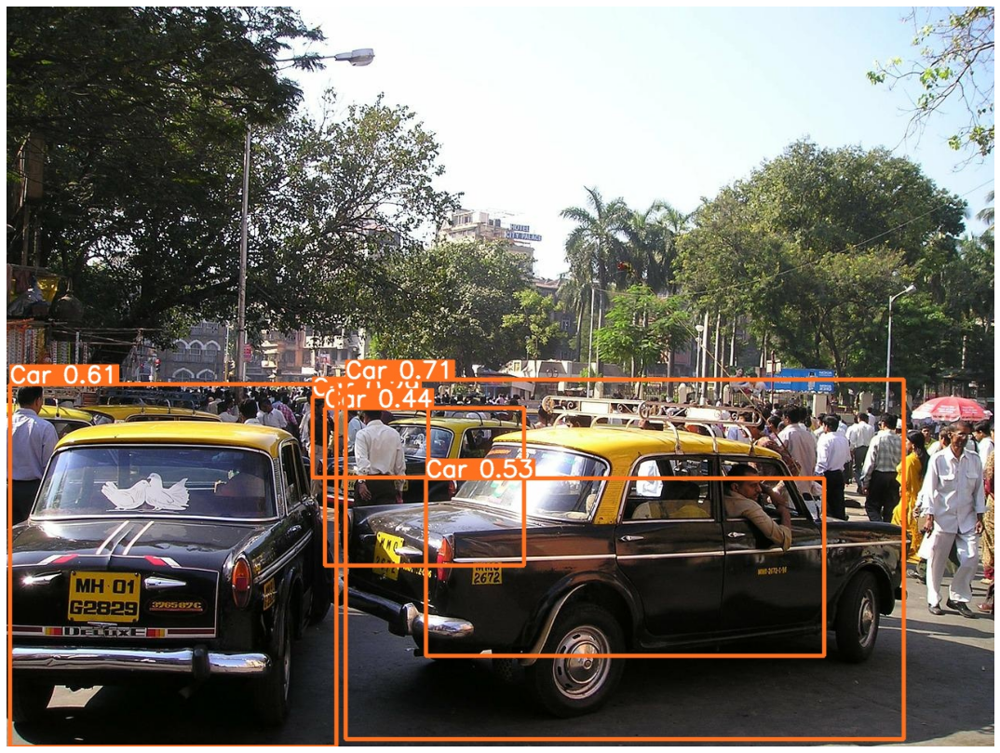

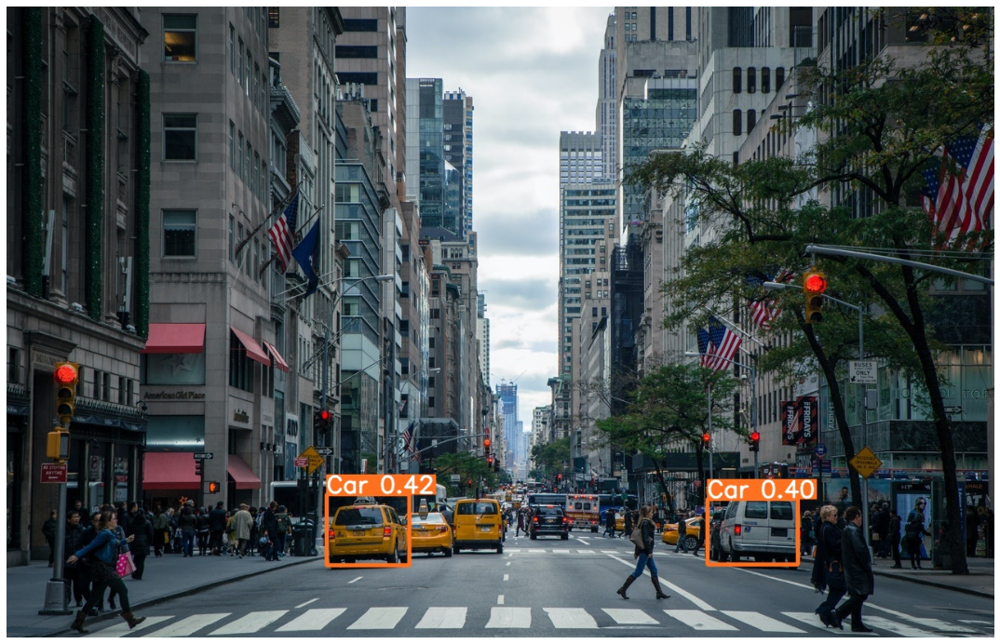

In [14]:
visualize(IMAGE_INFER_DIR)